# STA / LTA

In [1]:
# Define Constants
import os 

PATH = os.getcwd()

def Hour(integer):
    """
    More readable than doing 'sec x min x hour' every time.
    :returns: int, time in minutes
    """
    return 60 * 60 * integer

print("Finished")

Finished


In [2]:
# Read from file, convert into useable format

from pprint import pprint
from obspy import UTCDateTime

def read_file(relative_path):
    full_file_path = os.path.join(PATH, relative_path)
    
    with open(full_file_path) as file:
        return file.readlines()
    
    
def convert_to_UTCDateTime(date, hr_min, seconds):
    year, month, day = date[:4], date[4:6], date[6:8]
    utc_date = "-".join([year, month, day])

    hr, mn = hr_min[0:2], hr_min[2:4]  
    utc_time = f"T{hr}:{mn}:{seconds}"
    
    return UTCDateTime(utc_date + utc_time)
  
    
lines = read_file('earthquake-data.sum')
columns, *earthquakes = [line.strip().split()[0:3] for line in lines] # Only keep (date, hr_min, seconds) 
quaketimes = [convert_to_UTCDateTime(*quake) for quake in earthquakes]  # *quake passes the list as arguments to the UTCDateTime function
print("Sucessfully Read Quaketimes")

Sucessfully Read Quaketimes


In [3]:
# Get waveforms from server

from obspy.clients.fdsn import Client
from obspy import Stream

client = Client("http://10.254.144.226/")
duration = 60  # The length of each Stream in seconds 
pre = 18  # How many seconds before the data point to start
station_info = [("TZ", "CES06", "", "HNZ", time - pre, time + duration) for time in quaketimes]  # Convert each UTCTime into station format to pull from the server
waveforms = [client.get_waveforms(*info) for info in station_info]   # Pull data from server. Note: using get_bulk_waveforms says "identification failed"
print("Retreived Data")

Retreived Data


In [13]:
import pickle
pickle.dump(waveforms, open( "tanzania-waveforms.p", "wb" )) # Write binary of Waveform data

Unprocessed


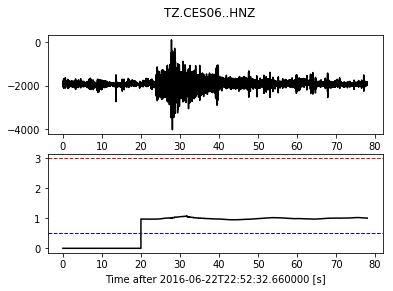

Butter Bandpass Filter: 1 - 14 HZ


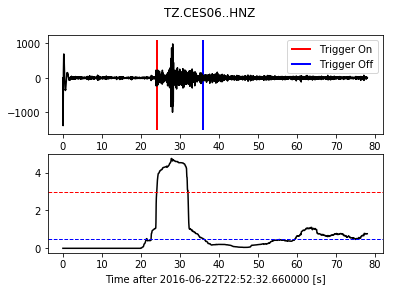

Unprocessed Spectrogram


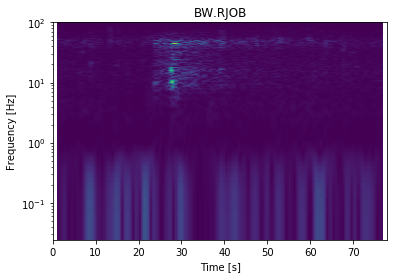

------------------------------------------------------------
Unprocessed


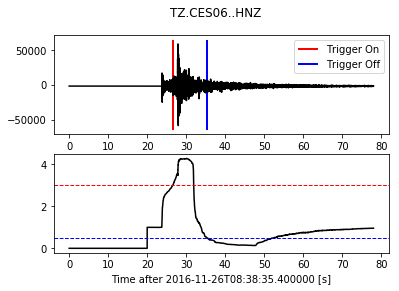

Butter Bandpass Filter: 1 - 14 HZ


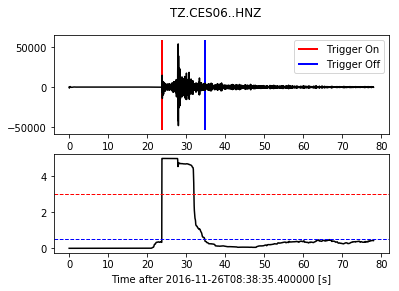

Unprocessed Spectrogram


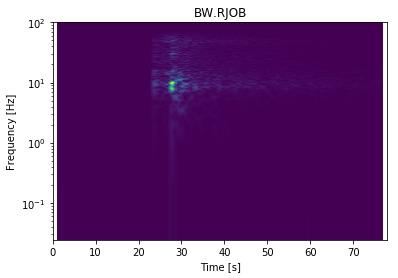

------------------------------------------------------------
Unprocessed


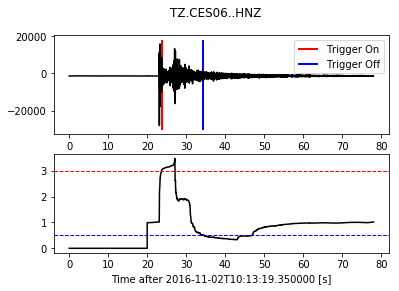

Butter Bandpass Filter: 1 - 14 HZ


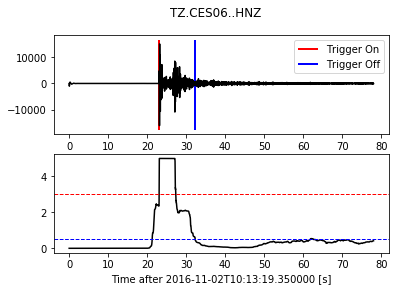

Unprocessed Spectrogram


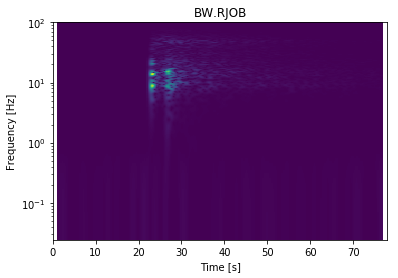

------------------------------------------------------------
Unprocessed


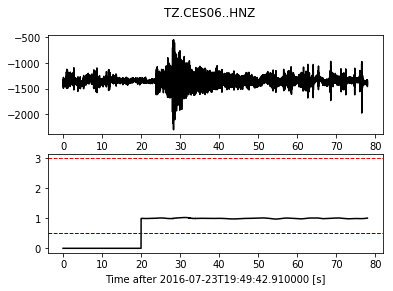

Butter Bandpass Filter: 1 - 14 HZ


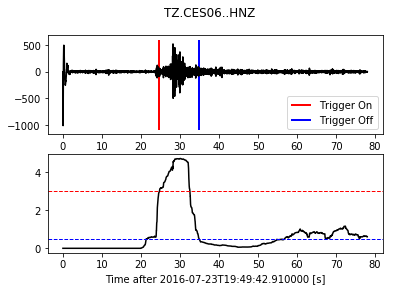

Unprocessed Spectrogram


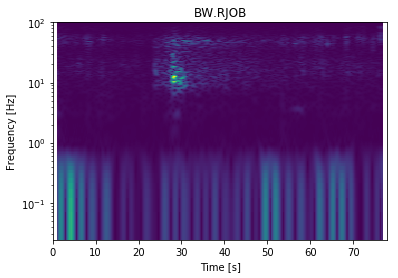

------------------------------------------------------------
Unprocessed


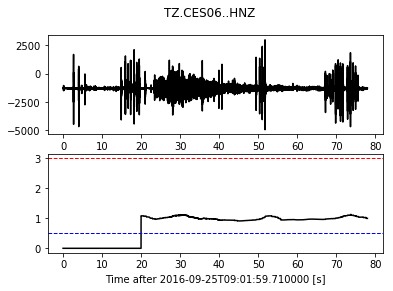

Butter Bandpass Filter: 1 - 14 HZ


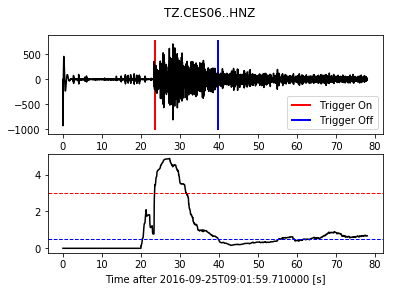

Unprocessed Spectrogram


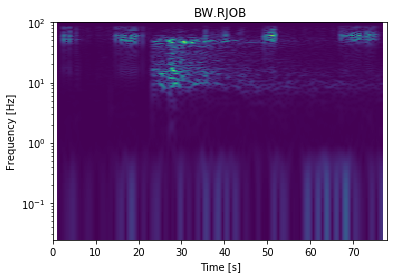

------------------------------------------------------------
Unprocessed


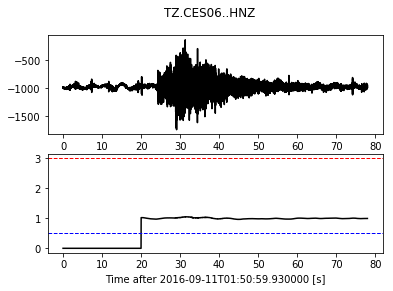

Butter Bandpass Filter: 1 - 14 HZ


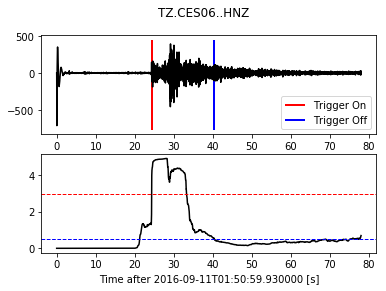

Unprocessed Spectrogram


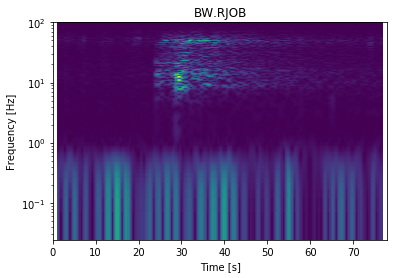

------------------------------------------------------------
Unprocessed


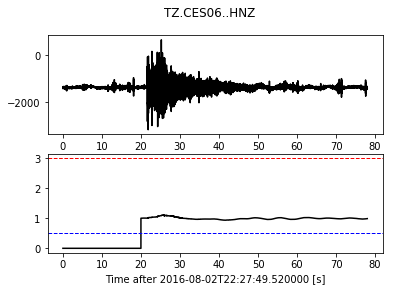

Butter Bandpass Filter: 1 - 14 HZ


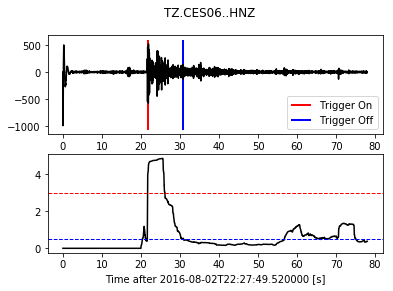

Unprocessed Spectrogram


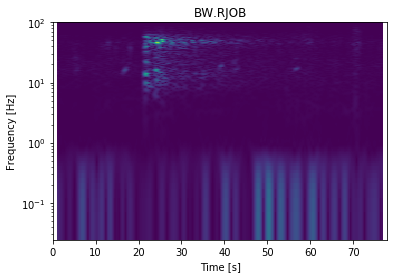

------------------------------------------------------------
Unprocessed


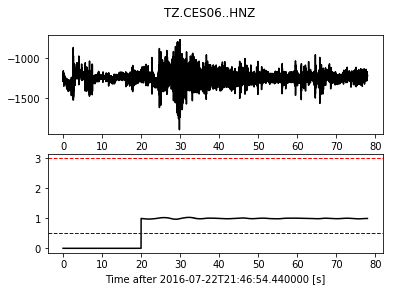

Butter Bandpass Filter: 1 - 14 HZ


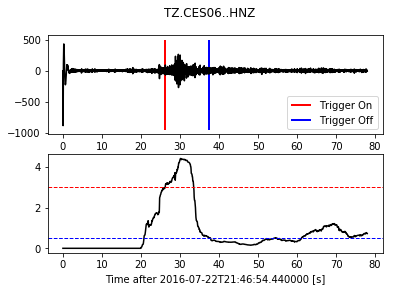

Unprocessed Spectrogram


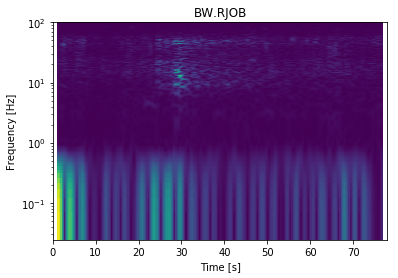

------------------------------------------------------------
Unprocessed


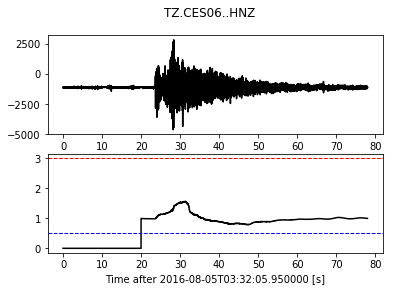

Butter Bandpass Filter: 1 - 14 HZ


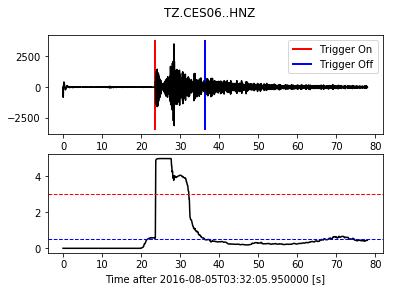

Unprocessed Spectrogram


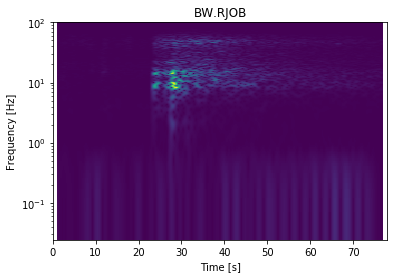

------------------------------------------------------------
Unprocessed


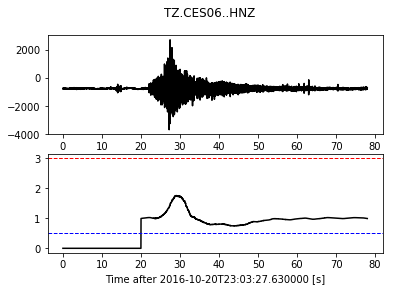

Butter Bandpass Filter: 1 - 14 HZ


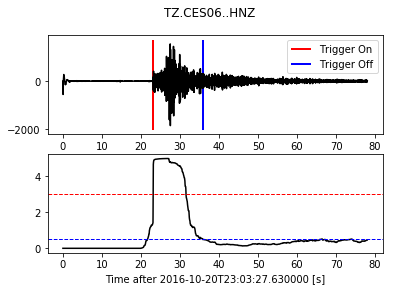

Unprocessed Spectrogram


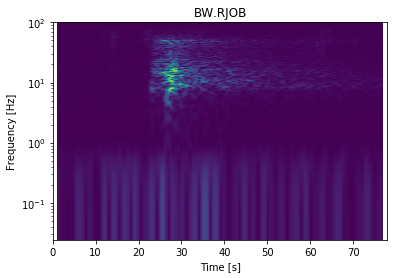

------------------------------------------------------------
Unprocessed


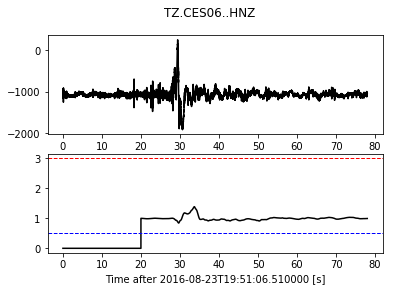

Butter Bandpass Filter: 1 - 14 HZ


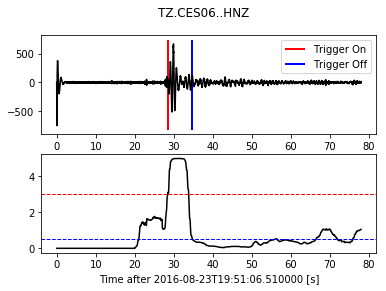

Unprocessed Spectrogram


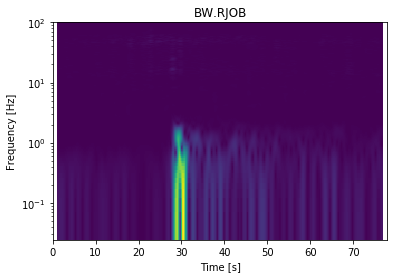

------------------------------------------------------------
Unprocessed


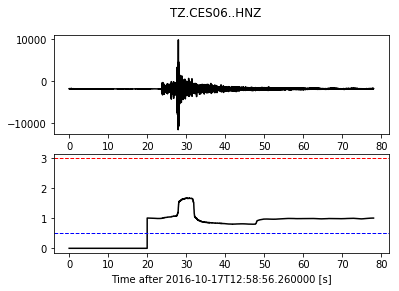

Butter Bandpass Filter: 1 - 14 HZ


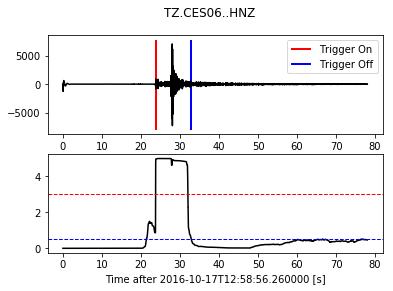

Unprocessed Spectrogram


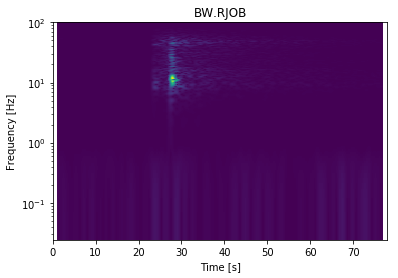

------------------------------------------------------------
Unprocessed


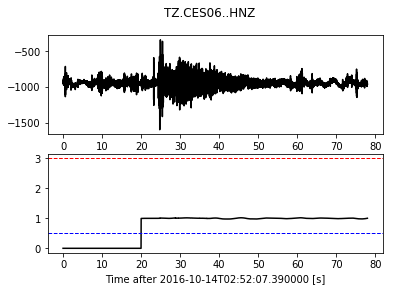

Butter Bandpass Filter: 1 - 14 HZ


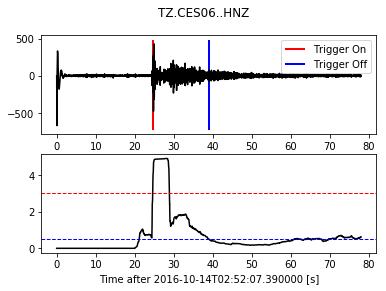

Unprocessed Spectrogram


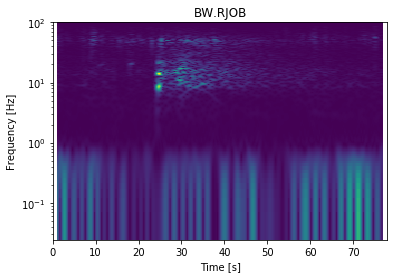

------------------------------------------------------------
Unprocessed


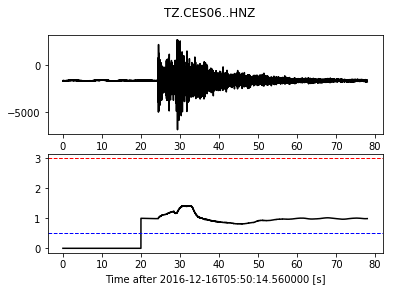

Butter Bandpass Filter: 1 - 14 HZ


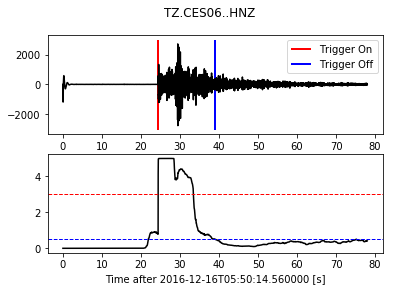

Unprocessed Spectrogram


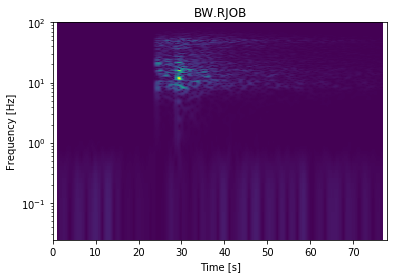

------------------------------------------------------------
Unprocessed


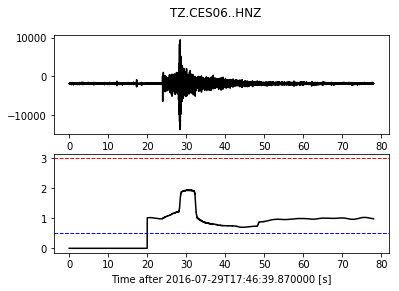

Butter Bandpass Filter: 1 - 14 HZ


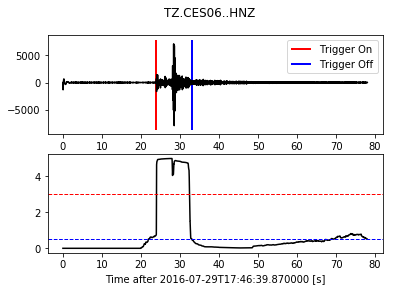

Unprocessed Spectrogram


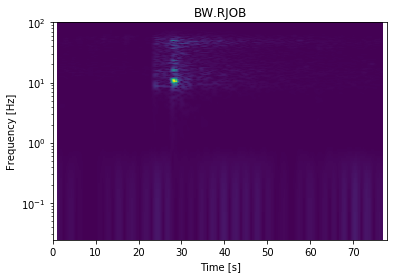

------------------------------------------------------------
Unprocessed


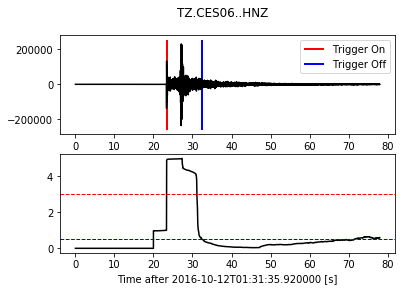

Butter Bandpass Filter: 1 - 14 HZ


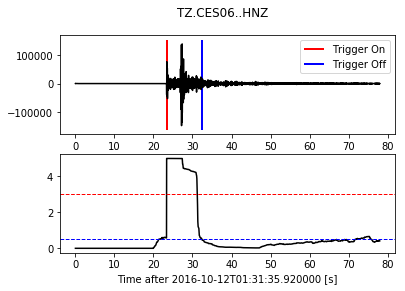

Unprocessed Spectrogram


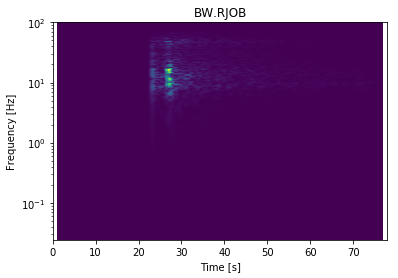

------------------------------------------------------------
Unprocessed


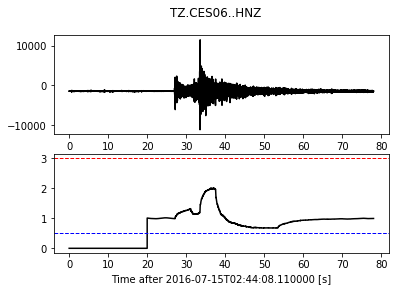

Butter Bandpass Filter: 1 - 14 HZ


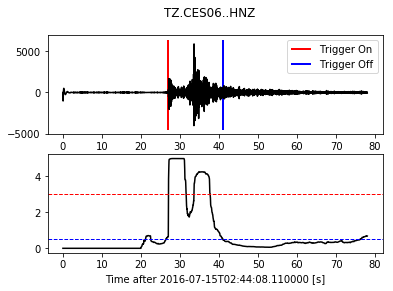

Unprocessed Spectrogram


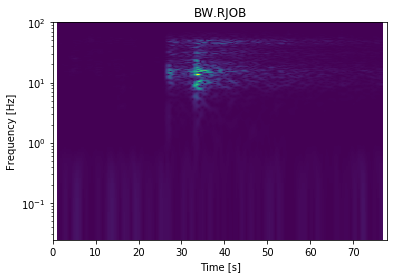

------------------------------------------------------------
Unprocessed


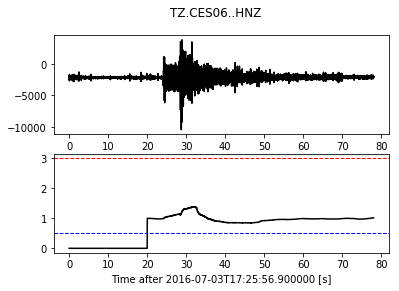

Butter Bandpass Filter: 1 - 14 HZ


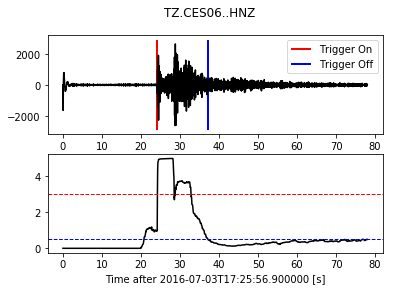

Unprocessed Spectrogram


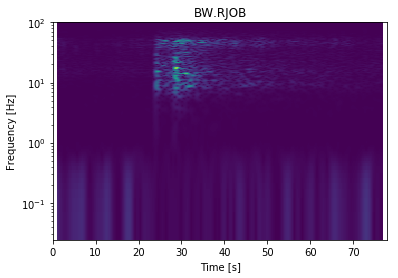

------------------------------------------------------------
Unprocessed


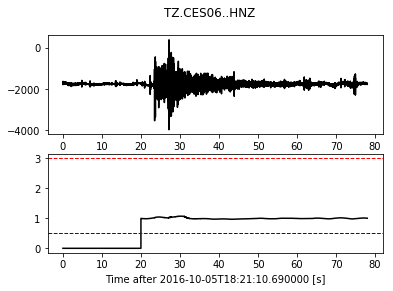

Butter Bandpass Filter: 1 - 14 HZ


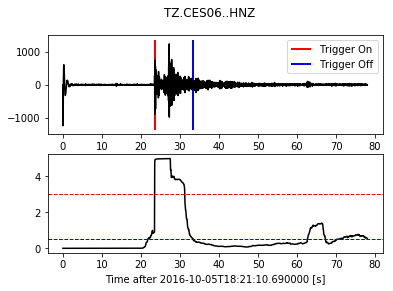

Unprocessed Spectrogram


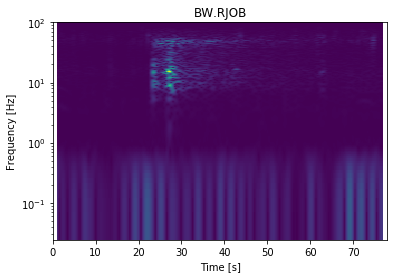

------------------------------------------------------------
Unprocessed


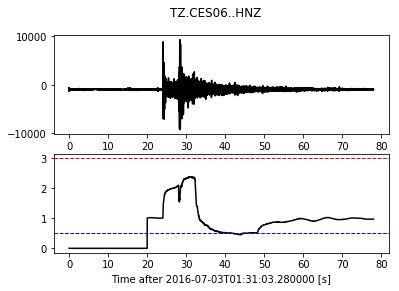

Butter Bandpass Filter: 1 - 14 HZ


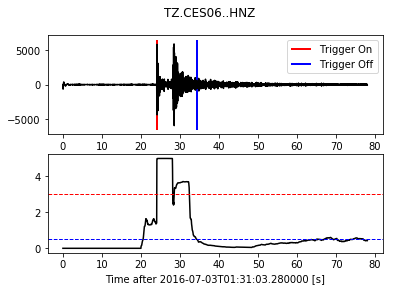

Unprocessed Spectrogram


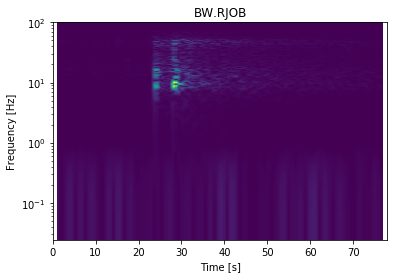

------------------------------------------------------------
Unprocessed


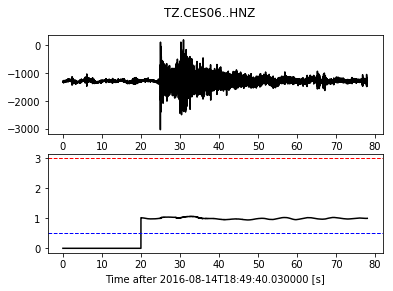

Butter Bandpass Filter: 1 - 14 HZ


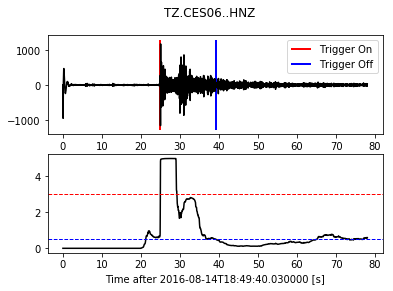

Unprocessed Spectrogram


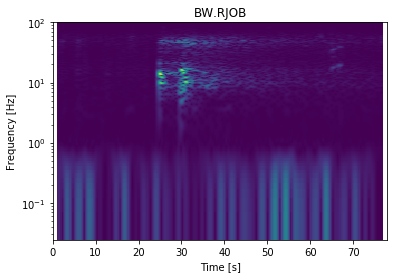

------------------------------------------------------------
Unprocessed


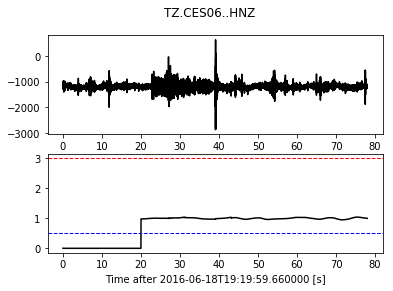

Butter Bandpass Filter: 1 - 14 HZ


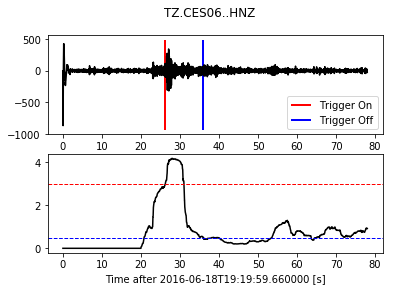

Unprocessed Spectrogram


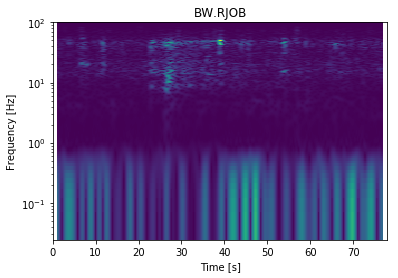

------------------------------------------------------------


In [4]:
# Simple STA / LTA on the earthquakes

from obspy.signal.trigger import classic_sta_lta
from obspy.signal.trigger import plot_trigger
from obspy.core.trace import Trace
from obspy.signal.filter import bandpass
from functools import reduce
import operator as op
import matplotlib.pyplot as plt


def merge_traces(stream):
    """
    Adds the traces of a waveform, and returns a singal trace
    :returns: Trace
    """
    return reduce(op.add, stream)
    
def plot_stalta(trace, sw_length, lw_length, threshold_on=2, threshold_off=.5, show_plot=True):
    """
    :param sw_ratio: int, the length of the small window in seconds
    :param sw_ratio: int, the length of the large window in seconds
    """
    cft = classic_sta_lta(trace.data, int(sw_length * trace.stats.sampling_rate), int(lw_length * trace.stats.sampling_rate)) # data, small window, large window
    return plot_trigger(trace, cft, threshold_on, threshold_off, show=show_plot)



swl = 4  # short window length in seconds
lwl = 20  # large window length in seconds
freq_min = 1 # Cutoff frequency in hz for butter filter
freq_max = 14 # Cutoff frequency in hz for butter filter
threshold_on = 3  # Ratio to trigger the threshold on


traces = [merge_traces(trace) for trace in waveforms.copy()]  
traces_filtered = [trace.copy().filter('bandpass', freqmin=freq_min, freqmax=freq_max)
                    for trace in traces]

    
# Do STA_LTA on waveforms
for trace, trace_filtered in zip(traces, traces_filtered):
    
    print("Unprocessed")
    plot_stalta(trace, swl, lwl, threshold_on=threshold_on)
    
    # Plot Filtered Trace
    print(f"Butter Bandpass Filter: {freq_min} - {freq_max} HZ")
    plot_stalta(trace_filtered, swl, lwl, threshold_on=threshold_on)
    
    # Unprocessed Spectrogram
    print("Unprocessed Spectrogram")
    trace.spectrogram(log=True, title='BW.RJOB')
    
    print("-" * 60)
    


Largest Quake


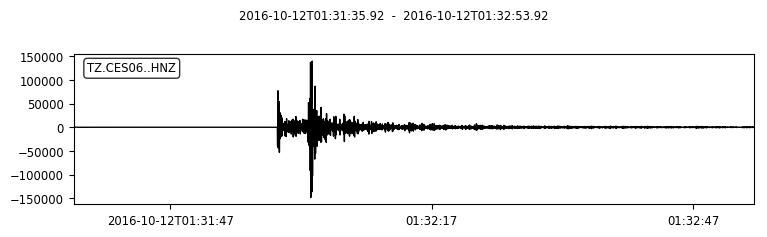

In [5]:
# Get Largest Quake by Amplitude

from pprint import pprint 
from obspy.signal.trigger import coincidence_trigger
from obspy import Stream

def get_largest_quake(trace_list):
    """
    Finds the trace containing the largest amplitude in the list, and returns it.
    :param stream: list of traces, each trace representing one earthquake
    :returns: trace, the trace containing the largest amplitude data point
    
    Be sure to apply any necessary filtering before passing the traces to the function.
    """
    return max(trace_list, key=lambda trace: abs(trace.max()))  # key=max says to call trace.max() as the comparison value. 

quake = get_largest_quake(traces_filtered)
print("Largest Quake")
quake.plot()

In [9]:
print(quake.stats.starttime,
quake.stats.endtime)

2016-10-12T01:31:35.920000Z 2016-10-12T01:32:53.920000Z


# STA / LTA 1 Week 

In [6]:
# STA LTA - Get a week of data starting from the largest quake
days = 7
duration = Hour(24) * days  # A week's length 
waveform = client.get_waveforms("TZ", "CES06", "", "HNZ", quake.stats.starttime, quake.stats.starttime + duration)
print("Got data")

Got data


In [7]:
# STA LTA - Format and Process Data

def reformat_trace_length(stream, length):
    """
    * Use stream.slide() instead if possible *
    Reformats stream traces into equal lengthed traces. This is an in-place operation, affecting the original stream.
    :param stream: The stream
    :param length: float, the length in seconds of each trace  
    """
    trace = merge_traces(stream)
    stream.clear()   # Remove all traces

    start, end = trace.stats.starttime, trace.stats.starttime + length
    
    while (start < trace.stats.endtime):    
        stream.append(trace.slice(start, end))
        start, end = end, end + length 
    
    return stream


# Bandpass Filter Parameters
freq_min = 1
freq_max = 14 

stream = waveform.copy().filter('bandpass', freqmin=freq_min, freqmax=freq_max) # Apply bandpass filter
print("Filtered")

Filtered


Day 1


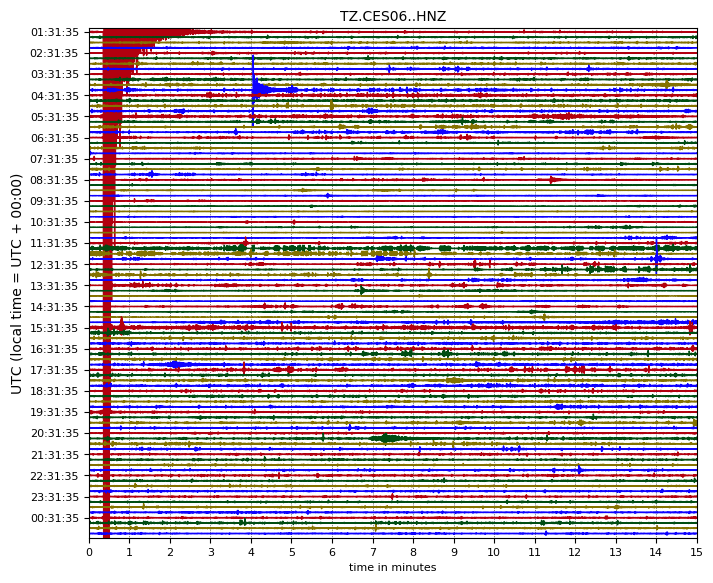

Day 2


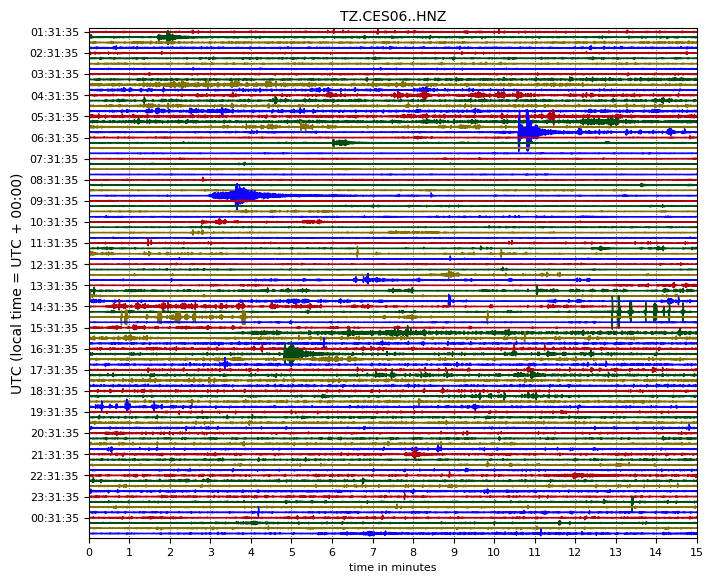

Day 3


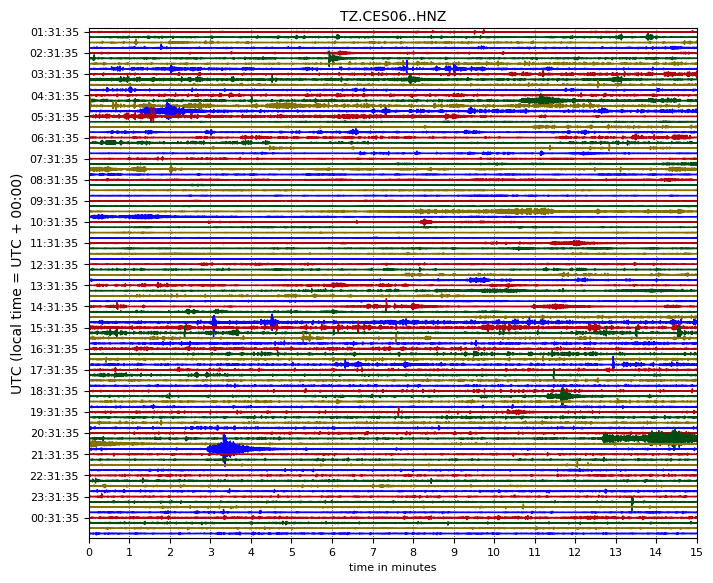

Day 4


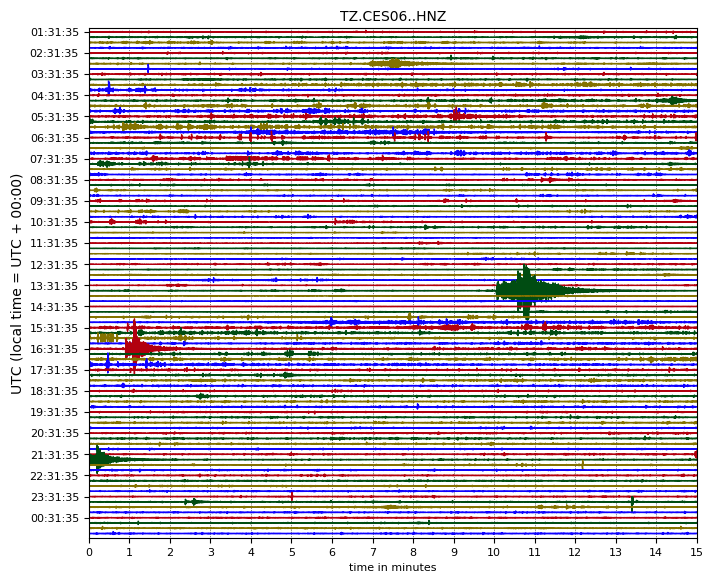

Day 5


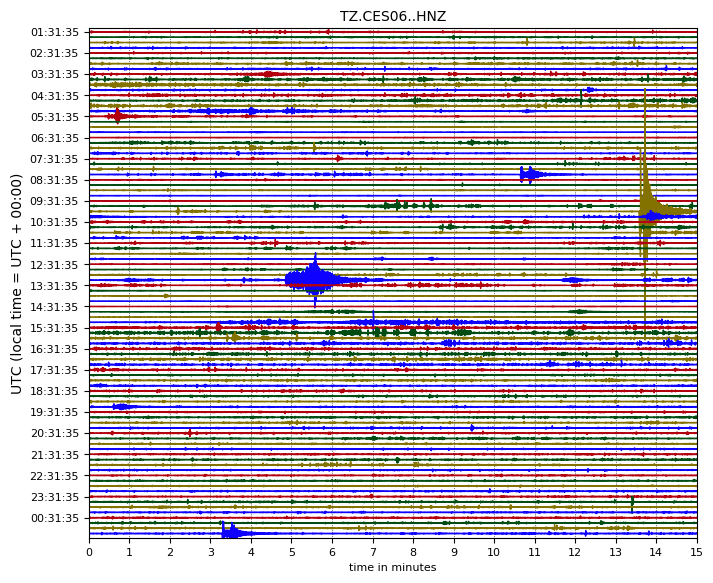

Day 6


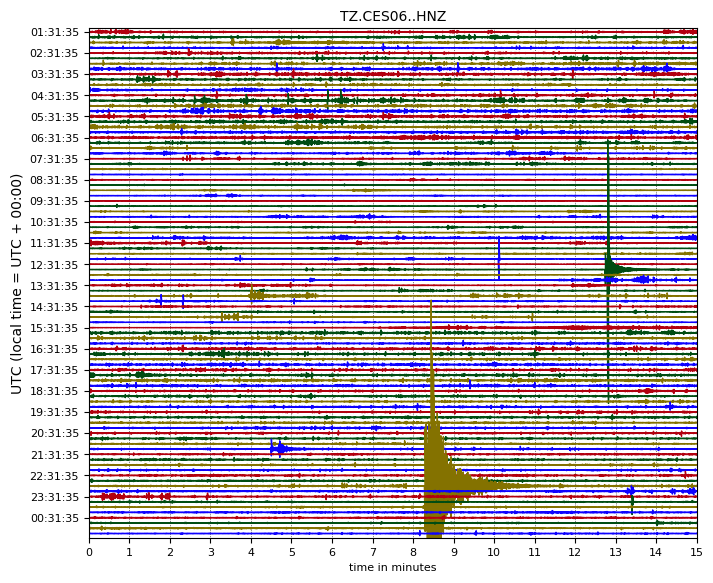

Day 7


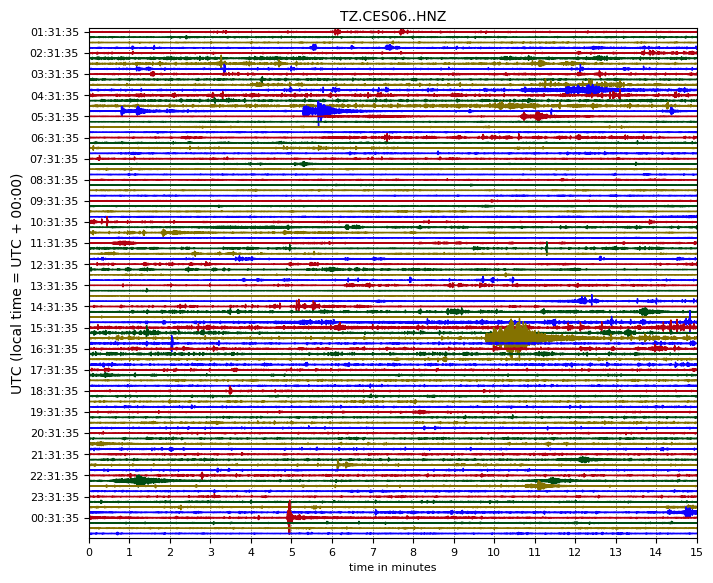

In [8]:
# STA LTA: Plot Week of Bandpass Filtered Data

for i, trace in enumerate(stream.slide(window_length=Hour(24), step=Hour(24))):
    print(f"Day {i+1}")
    trace.plot(type='dayplot')
    

In [9]:
# Run STA / LTA on the Data
st = reformat_trace_length(stream, Hour(24))   # Format our stream into 24 hours lengthed traces\
print("Reformatted")

Reformatted


24 Hours of Data


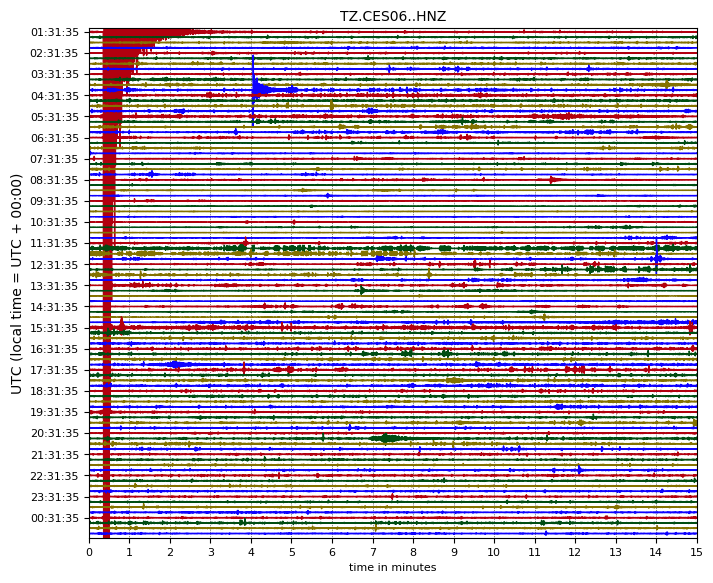

STA LTA On 24 Hour Interval


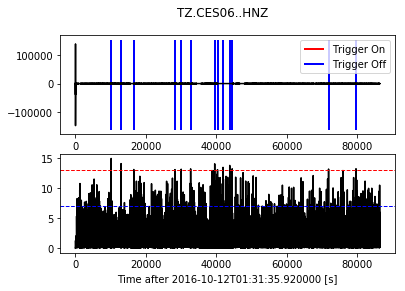

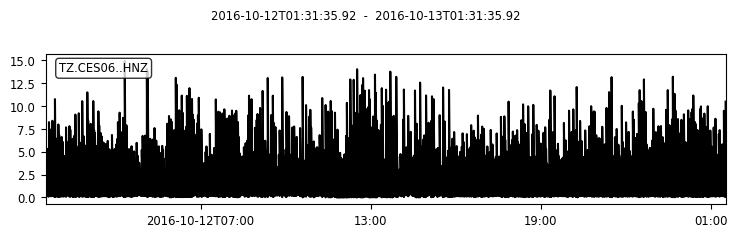

In [10]:
# STA LTA on 24 HOUR INTERVAL

threshold_on = 13
threshold_off = 7
lw = 30  # Long window
sw = 2  # Short window

print("24 Hours of Data")
trace = st[0].copy()
trace.plot(type='dayplot')

print("STA LTA On 24 Hour Interval")
plot_stalta(trace, sw, lw, threshold_on=threshold_on, threshold_off=threshold_off)

sta_lta = trace.copy().trigger("classicstalta", sta=sw, lta=lw)
sta_lta.plot()

In [11]:
from collections import namedtuple
from obspy.signal.trigger import trigger_onset, classic_sta_lta


def sample_to_seconds(integer, sampling_rate):
    """
    :param integer: int, the sample number eg. 80 if it's the 80'th sample. 
    """
    return integer / sampling_rate


def sample_to_UTC(sample, start, sampling_rate):
    """ Converts a sample number to the UTCDateTime object since the start """
    return start + sample_to_seconds(sample, sampling_rate)


def samples_to_UTC(samples, start, sampling_rate):
    return [sample_to_UTC(sample, start, sampling_rate) for sample in samples]


def get_peak_times(trace, threshold_on, threshold_off):
    """
    Prefer to use 'signal.trigger_onset()' if possible as it's much faster (numpy operations).
    Pass in a trace, get back a NamedTuple, the UTC time of the event and the Y axis value.
    :param threshold_on: Threshold value, record events greater than this value.
    :param threshold_on: Threshold value, stop recording event when lower than this value.

    :returns: NamedTuple, the UTC time of the event and the Y axis value.
    """
    Peak = namedtuple("Peak", ["time", "amplitude"])
    start = trace.stats.starttime
    sampling_rate = trace.stats.sampling_rate

    peaks = []  # List of Peak objects
    triggered = False  # If the trigger is on
    
    for i, sample in enumerate(trace):
        # Records Peak if sample is higher than the threshold
        if sample >= threshold_on and not triggered:
            time = sample_to_UTC(i, start, sampling_rate)#sample_to_UTC(i, start, sampling_rate)   # UTC time of the event
            peak = Peak(time, sample)
            peaks.append(peak)   
            
        # Turn off the trigger if the sample falls below the low threshold
        # ???? May need to fix this
        triggered = False if sample >= threshold_on else True  
        
    return peaks

# Example Use Case

#peaks = get_peak_times(sta_lta, threshold_on, threshold_off)
#pprint(peaks)

In [12]:
# Do STA/LTA On a Week of Data, and get the Trigger Times

Time = namedtuple("Time", ["start", "end"])  # Allows access to tuple elements with 'start' as tuple[0] and 'end' tuple[1]

# Calculate the sta_lta function
trace = merge_traces(st)   # Use an entire week's worth of data
cft = classic_sta_lta(trace.data, int(sw * trace.stats.sampling_rate), int(lw * trace.stats.sampling_rate))
times = trigger_onset(cft, threshold_on, threshold_off)  #  # Returns the on/off times in samples as a tuple: (TriggerTimeOn, TriggerTimeOff)

# Convert to a more useable format, from samples to UTCDateTimes
times = [samples_to_UTC(pair, trace.stats.starttime, trace.stats.sampling_rate) for pair in times] # Convert to UTC
times = [Time(start=time[0], end=time[1]) for time in times]  # Times as a 'Time' namedtuple

pprint(times)

[Time(start=UTCDateTime(2016, 10, 12, 4, 20, 39, 640000), end=UTCDateTime(2016, 10, 12, 4, 20, 41, 865000)),
 Time(start=UTCDateTime(2016, 10, 12, 5, 7, 35, 115000), end=UTCDateTime(2016, 10, 12, 5, 7, 37, 400000)),
 Time(start=UTCDateTime(2016, 10, 12, 6, 7, 48, 165000), end=UTCDateTime(2016, 10, 12, 6, 7, 49, 500000)),
 Time(start=UTCDateTime(2016, 10, 12, 9, 22, 30, 530000), end=UTCDateTime(2016, 10, 12, 9, 22, 31, 420000)),
 Time(start=UTCDateTime(2016, 10, 12, 9, 52, 5, 765000), end=UTCDateTime(2016, 10, 12, 9, 52, 7, 420000)),
 Time(start=UTCDateTime(2016, 10, 12, 10, 36, 40, 585000), end=UTCDateTime(2016, 10, 12, 10, 36, 42, 335000)),
 Time(start=UTCDateTime(2016, 10, 12, 12, 30, 36, 215000), end=UTCDateTime(2016, 10, 12, 12, 30, 38, 220000)),
 Time(start=UTCDateTime(2016, 10, 12, 12, 43, 50, 815000), end=UTCDateTime(2016, 10, 12, 12, 43, 53, 685000)),
 Time(start=UTCDateTime(2016, 10, 12, 13, 9, 59, 780000), end=UTCDateTime(2016, 10, 12, 13, 10, 1, 740000)),
 Time(start=UTCDate

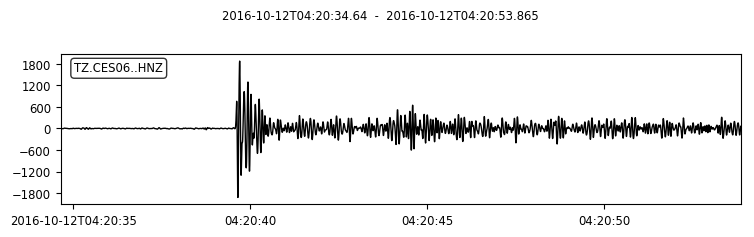

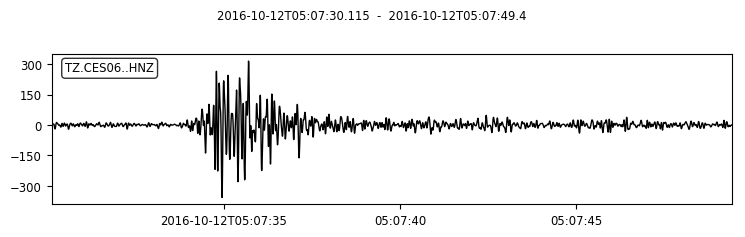

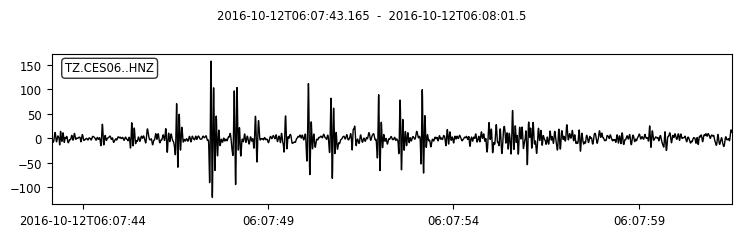

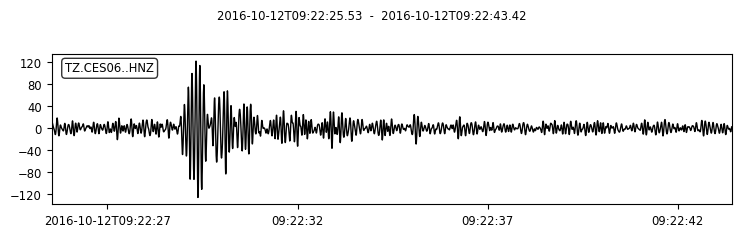

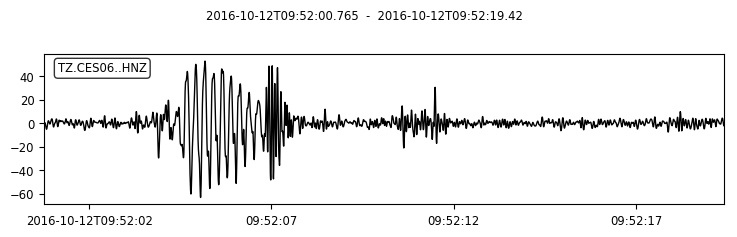

...

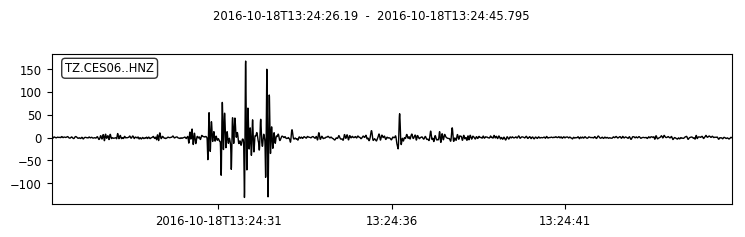

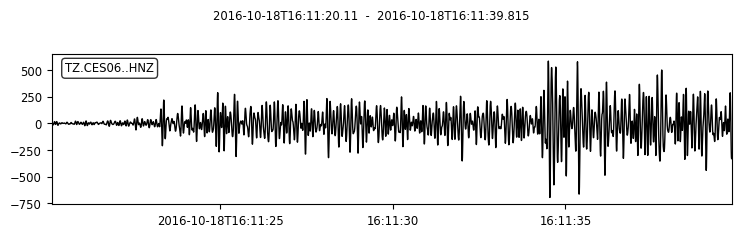

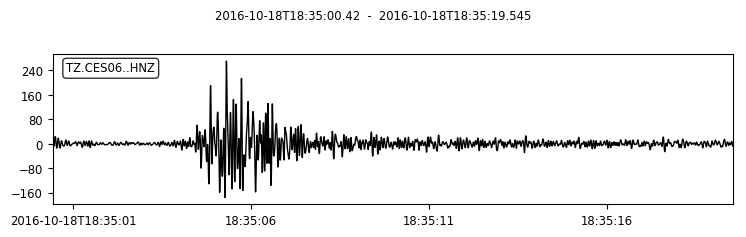

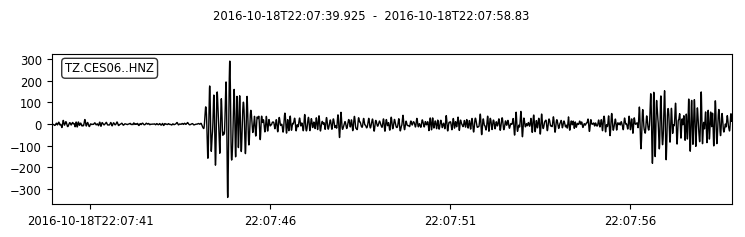

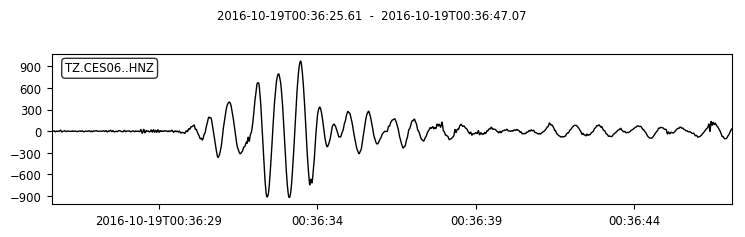

In [13]:
# Plot the Events

length = 12   # Time after event in Seconds
pre = 5       # Time before event in Seconds

# Get the found STALTA events
events = [trace.slice(time.start - pre, time.end + length) for time in times]

for event in events:
    event.plot()
    #event.spectrogram()

# Template Matching

In [14]:
from obspy.signal import cross_correlation as cc 
from typing import List
import numpy as np
import matplotlib.pyplot as plt

# Trying out type hinting
template: Trace = quake  
start: UTCDateTime = quake.stats.starttime
end: UTCDateTime = quake.stats.endtime
stations: List[Stream] = [client.get_waveforms("TZ", f"CES0{i}", "", "HNZ", start, end) for i in range(1, 7)]

Largest Quake Across Stations


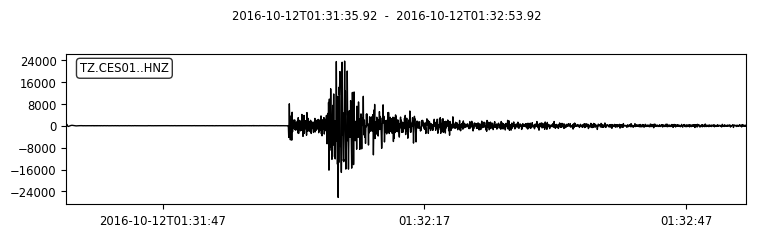

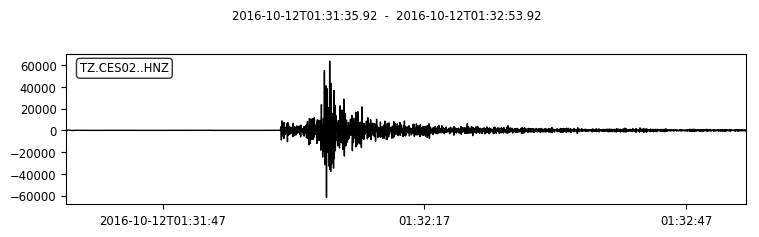

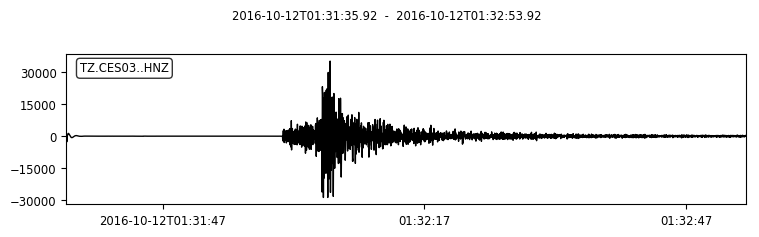

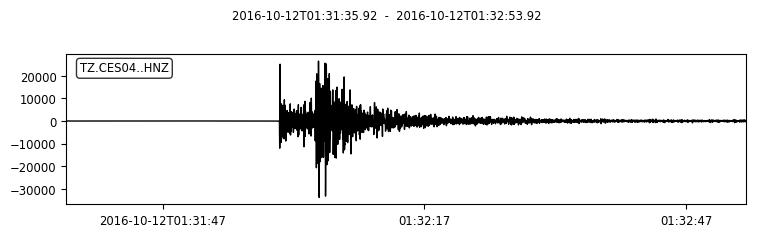

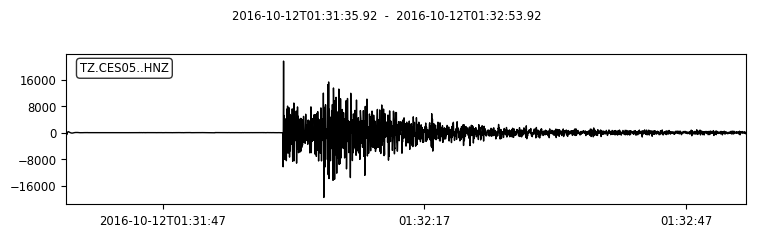

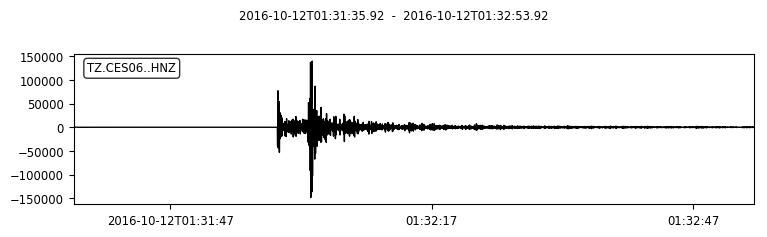

In [15]:

print("Largest Quake Across Stations")
for station in stations:
    station.filter('bandpass', freqmin=freq_min, freqmax=freq_max) # Apply bandpass filter
    station.plot()


 CES02: -0.19512105261414145 max correlation, 260 shift


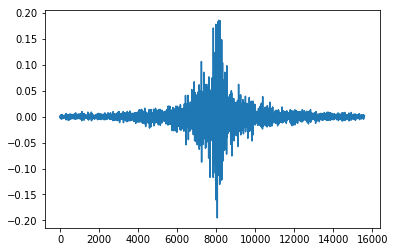

 CES03: -0.15514071293838078 max correlation, 491 shift


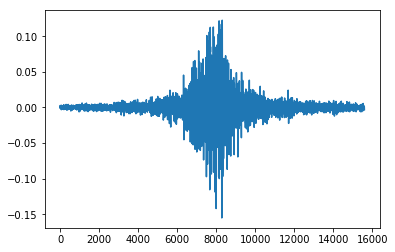

 CES04: -0.18893617682966427 max correlation, 330 shift


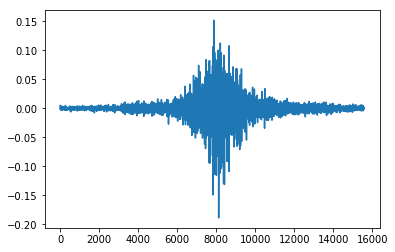

 CES05: 0.1419761140173779 max correlation, -1171 shift


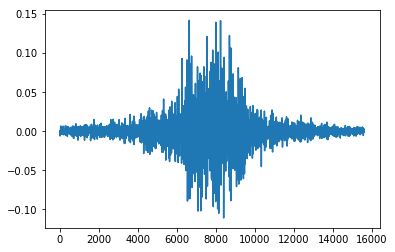

 CES06: 0.17278665316747413 max correlation, 808 shift


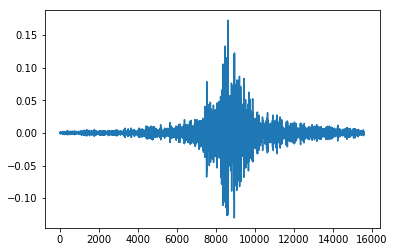

 Random Noise: 0.031033413637471106 max correlation, 2269 shift


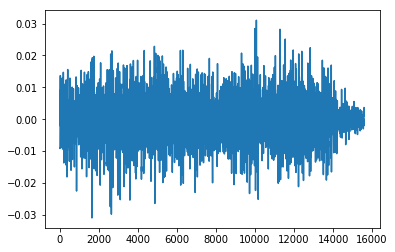

In [16]:
# Simple Cross Correlation of the largest earthquake accross multiple stations

template_trace, *traces = map(merge_traces, stations)  # Convert streams to single traces

# Add random noise for comparison
rand = template_trace.copy()
rand.data = np.random.randn(rand.count()).astype(np.float32)
rand.stats.station = "Random Noise"
traces.append(rand)

for trace in traces:
    correlation = cc.correlate(template_trace, trace, shift=int(trace.count() / 2))
    shift, value = cc.xcorr_max(correlation)
    print(f" {trace.stats.station}: {value} max correlation, {shift} shift")
    plt.plot(correlation)
    plt.show()

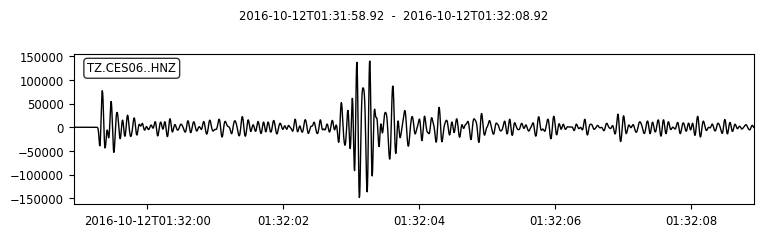

In [21]:
# Template Matching
length = Hour(24) * 7  # A Week of data

template = client.get_waveforms("TZ", f"CES06", "", "HNZ", start, end)
stream = client.get_waveforms("TZ", f"CES06", "", "HNZ", end, end + length)  # Start after the large earthquake

template.filter('bandpass', freqmin=freq_min, freqmax=freq_max) # Apply bandpass filter
stream.filter('bandpass', freqmin=freq_min, freqmax=freq_max)

template = template.trim(template[0].stats.starttime + 23, template[0].stats.endtime - 45)
template.plot()


In [48]:
# Run Cross Correlation on a Week of Data
Event = namedtuple("Event", ["correlation", "stream"])   

def template_match(template_trace, stream, correlation_threshold, view_length=None, step=None, print_progress=True):
    """
    Generator that yields each match in continous waveform data (stream) against a template trace.
    :param template_trace: the template waveform to correlate against
    :param stream: the continuous waveform data to compare against the template
    :param correlation_threshold: the minimum correlation value to be coutned as a match
    :param view_length: the length of the stream for matched events in seconds. Default: window_length
    :param step: the difference between windows in seconds. Default: window_length ie. 0 offset
    :yield Event: a named tuple, Event(correlation: float, stream: Stream)
    """
    num_samples = template_trace.count()
    window_length = sample_to_seconds(num_samples, template_trace.stats.sampling_rate) # Make it the same window length
    step = step or window_length
    view_length = view_length or window_length
    shift = int(num_samples / 2)
    
    for st, full_st in zip(stream.slide(window_length=window_length, step=window_length), 
                       stream.slide(window_length=view_length, step=window_length)): 
        
        tr = merge_traces(st)[:num_samples]  # Sometimes will be 1 sample too large due to rounding on window_length, so [:num_samples] makes the np array of samples the same length
        correlation = cc.correlate(tr, template_trace, shift=shift)
        shft, value = cc.xcorr_max(correlation)

        if abs(value) >= threshold:
            if print_progress: print(f"Match .", end=" ")
            yield Event(value, full_st)
            

template_trace = merge_traces(template)  
threshold = .45  # Correlation has to be higher than this to count as a match. Keep this value low to get many events, which can be filtered later.
view_length = 20  # time to add to the window, to get a better time frame to view the matched event
            
matches: List[Event] = list(template_match(template_trace, stream, threshold, view_length))
print(len(matches))


Match . Match . Match . Match . Match . Match . Match . Match . Match . Match . Match . Match . Match . Match . Match . Match . Match . Match . Match . Match . Match . Match . Match . Match . Match . Match . Match . Match . Match . Match . Match . Match . Match . Match . Match . Match . Match . Match . Match . Match . Match . Match . Match . Match . Match . Match . Match . Match . Match . Match . Match . 51


Template Waveform
Correlation: -0.5395669316016466


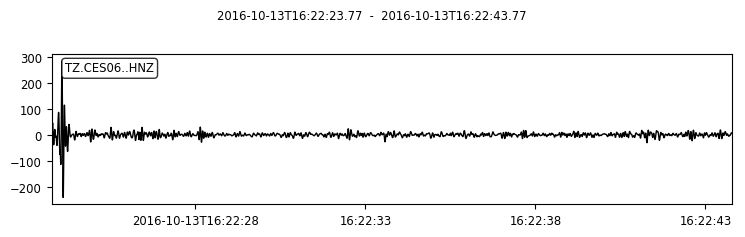

Correlation: 0.531879898451214


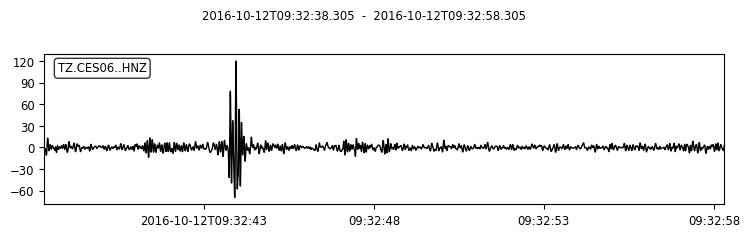

Correlation: -0.5250840441585665


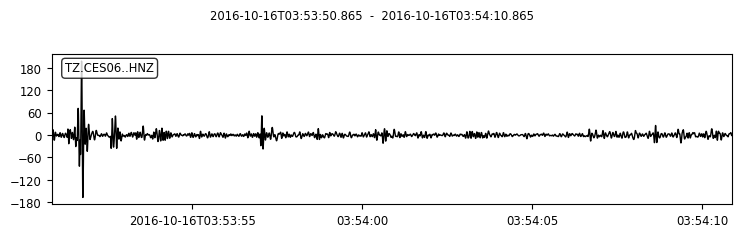

Correlation: -0.5226718690806448


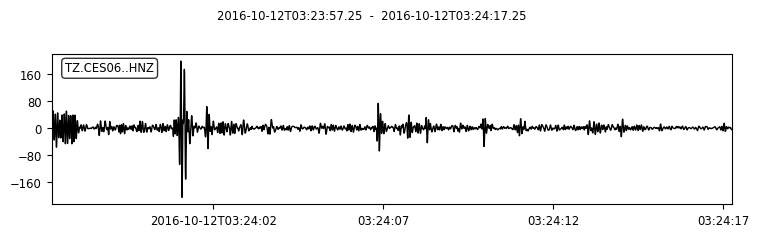

In [46]:
# Plot Template Matches Above Higher Threshold
import copy

def filter_events(events: List[Event], low_threshold, high_threshold=float('inf')):
    return sorted([event for event in events if low_threshold < abs(event.correlation) < high_threshold],
                  key=lambda event: abs(event.correlation), 
                  reverse=True)

def print_events(events: List[Event]):
    for event in filtered:
        print(f"Correlation: {event.correlation}")
        event.stream.plot()

threshold = .5
events = copy.deepcopy(matches) 
filtered = filter_events(events, threshold)

print("Template Waveform")
print_events(filtered)
    

Correlation: 0.4977278147541766


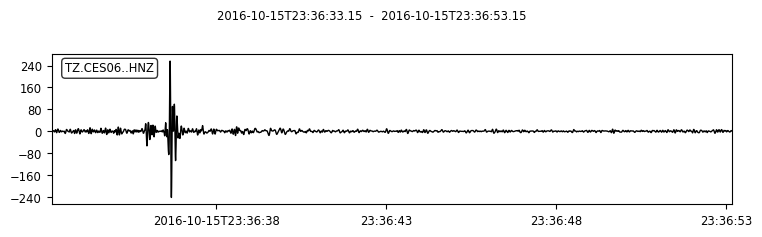

Correlation: -0.4948141081133353


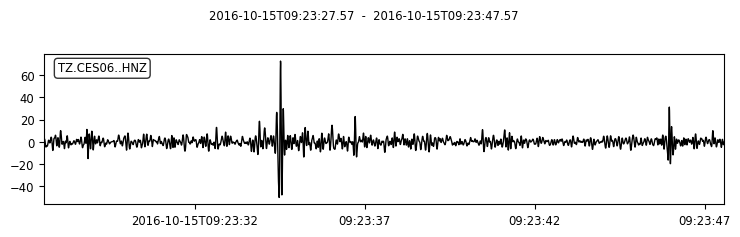

Correlation: -0.49125610935402475


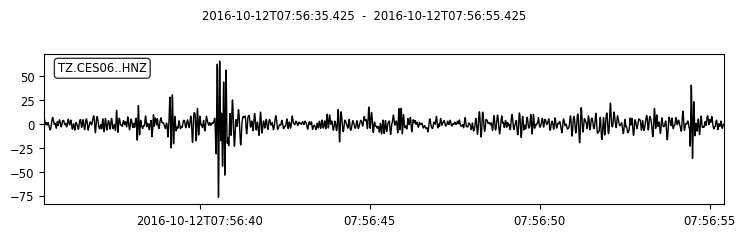

Correlation: 0.4892992817862174


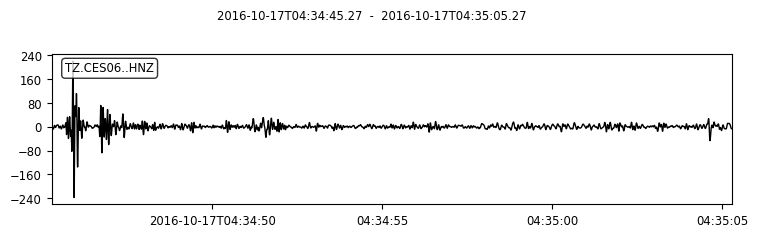

Correlation: 0.4889083582644987


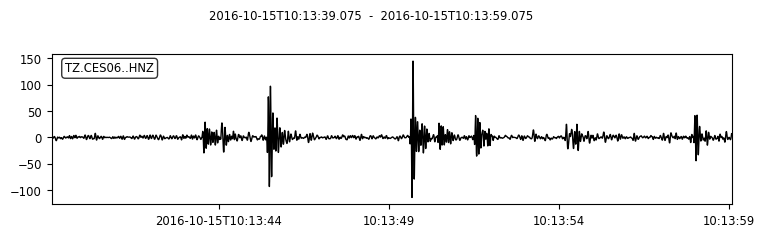

Correlation: 0.48588745250314824


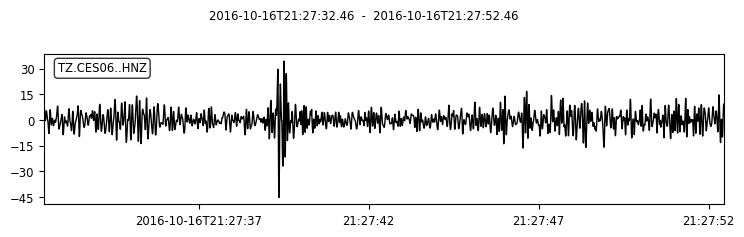

Correlation: -0.4858262773999386


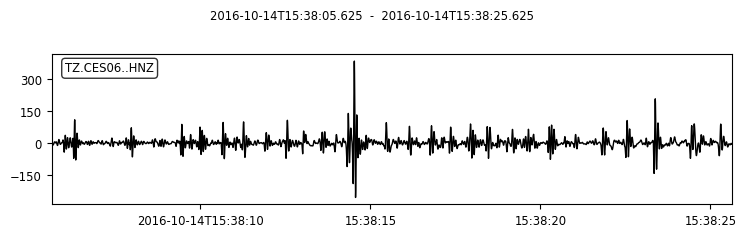

Correlation: 0.47890415169428285


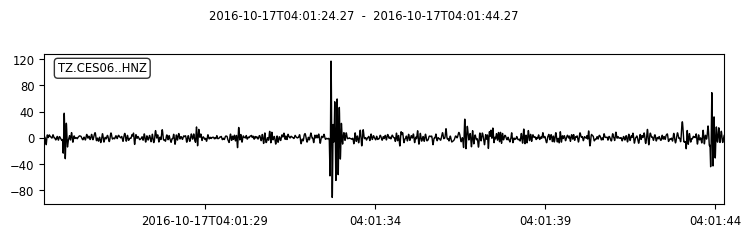

Correlation: -0.4787845102854198


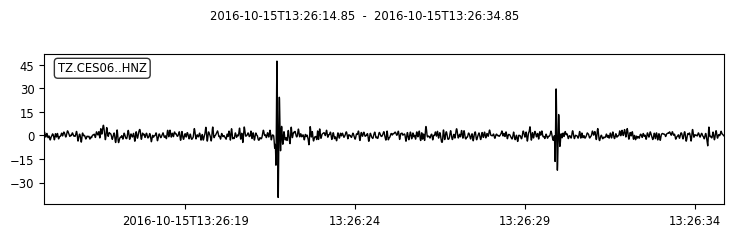

Correlation: -0.4770089618136688


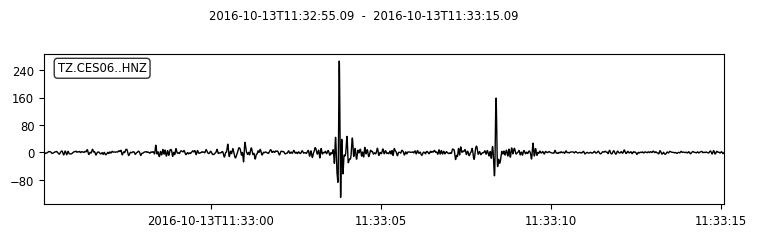

Correlation: 0.4757228104181989


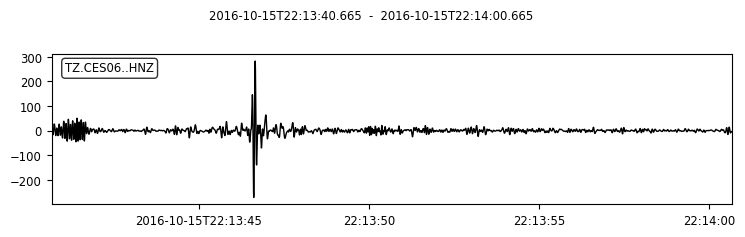

Correlation: -0.47547991594651434


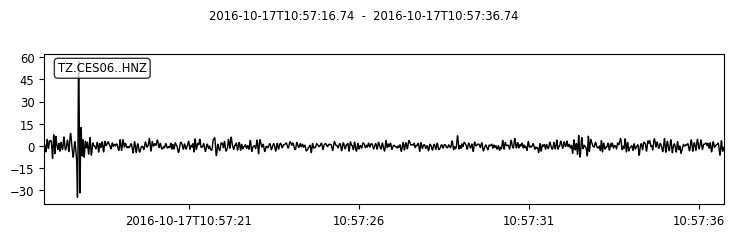

Correlation: 0.4737582903828953


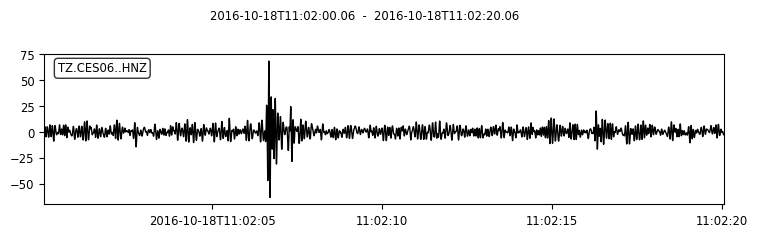

Correlation: -0.47299674333575076


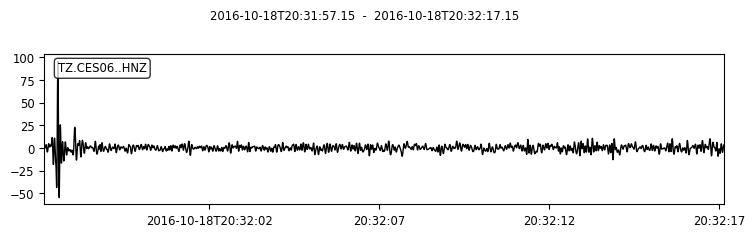

Correlation: -0.4724078911375941


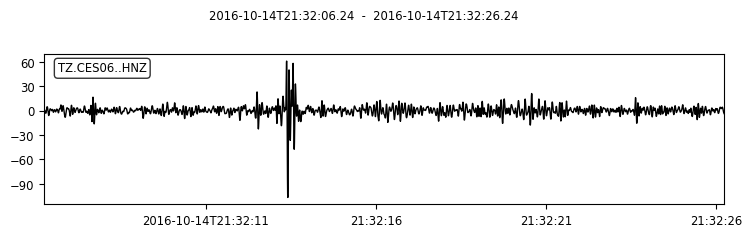

Correlation: -0.47162676703044354


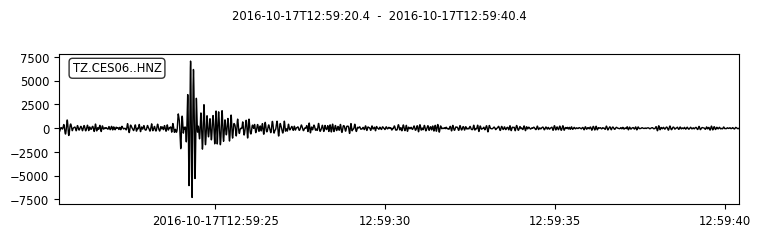

Correlation: -0.4709428910504545


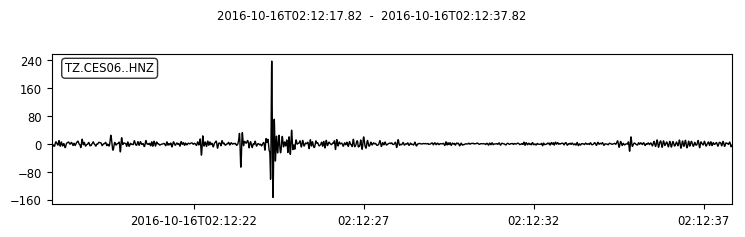

Correlation: -0.4694462073272297


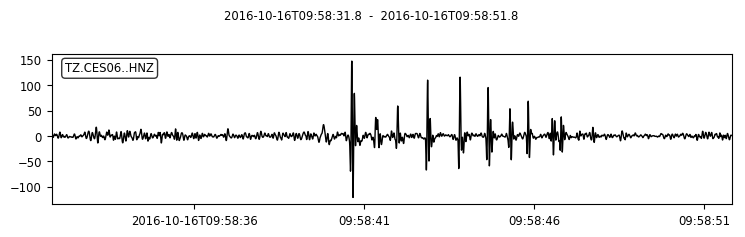

Correlation: -0.4680284662694029


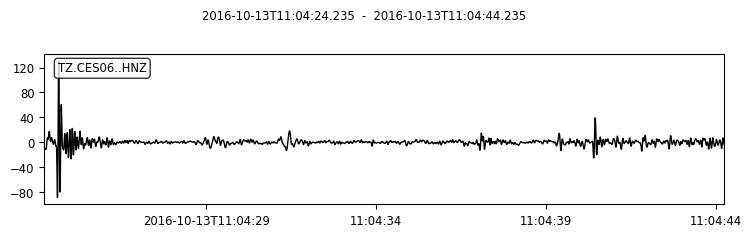

Correlation: 0.46779656820152793


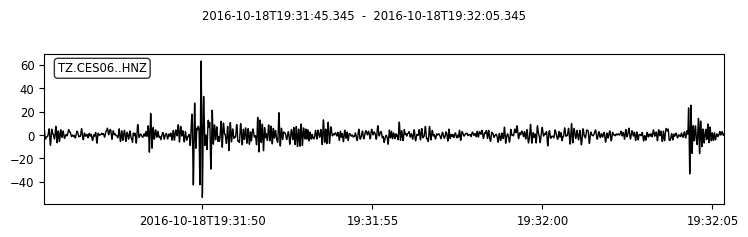

Correlation: 0.46532474832050214


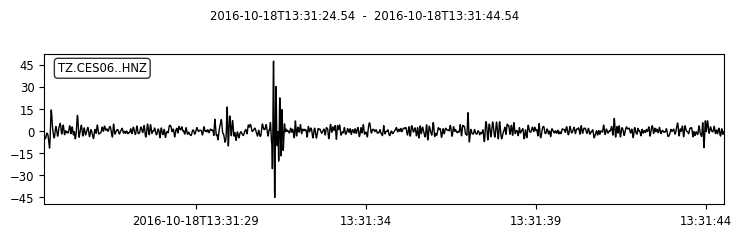

Correlation: 0.4642280166578806


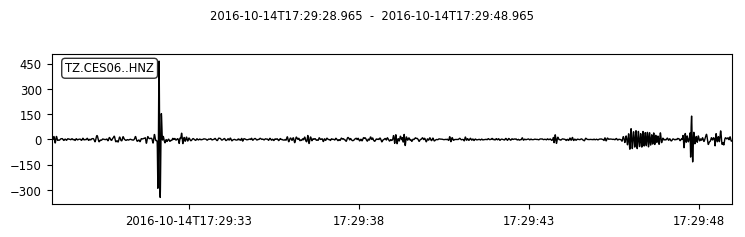

Correlation: -0.46313536193226273


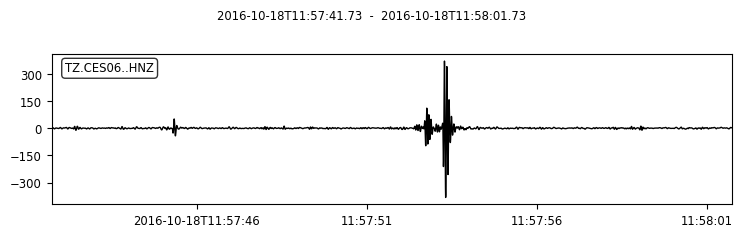

Correlation: 0.4624456645311129


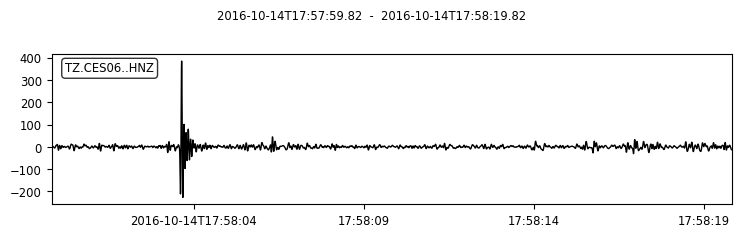

Correlation: -0.46229885747029215


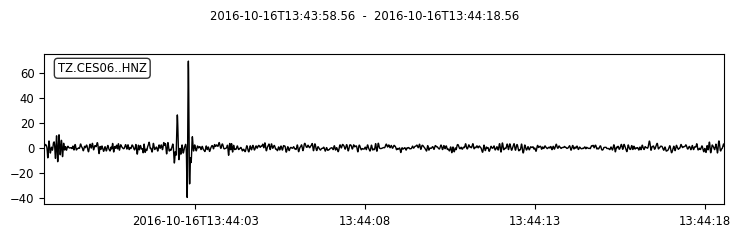

Correlation: -0.46186101052185335


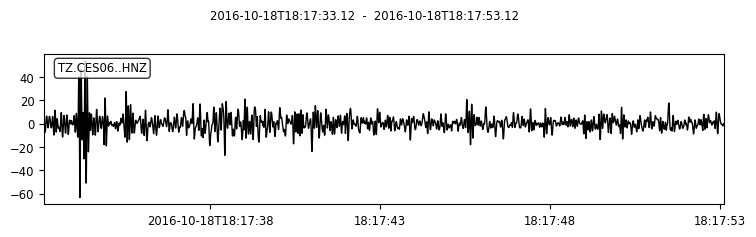

Correlation: -0.4613528384397053


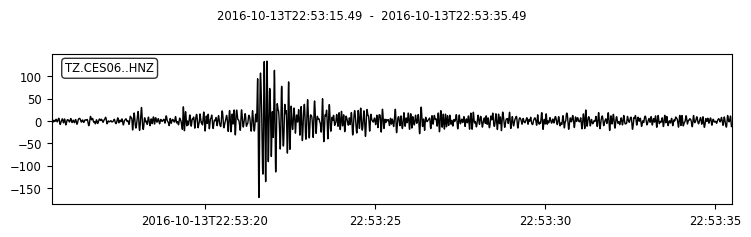

Correlation: -0.46084825921605327


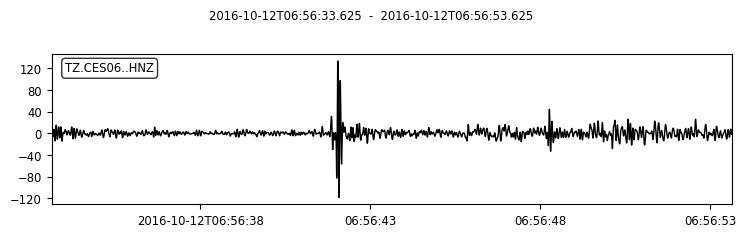

Correlation: 0.45990079668716244


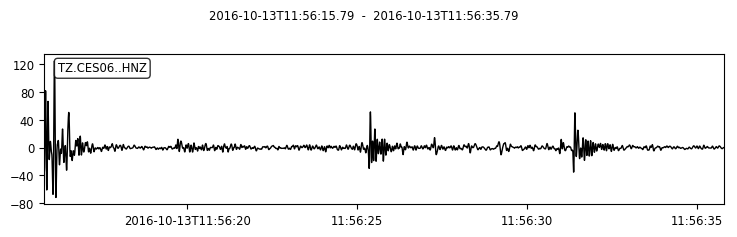

Correlation: -0.45987069800488917


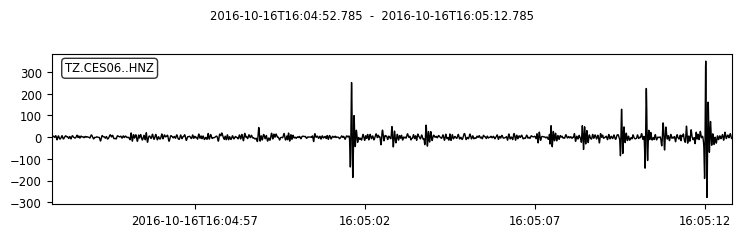

Correlation: -0.4596574861573522


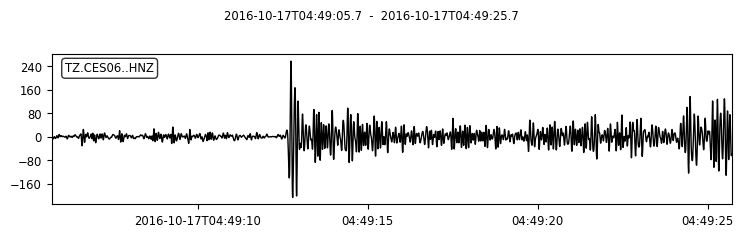

Correlation: 0.45862046934865636


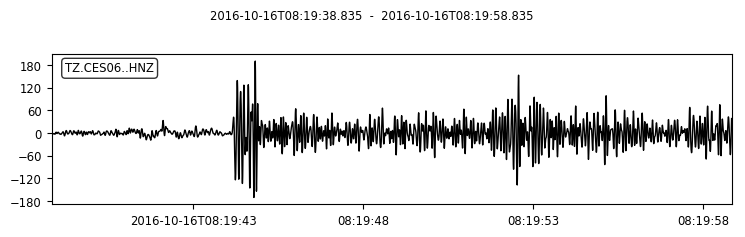

Correlation: 0.4582561591301267


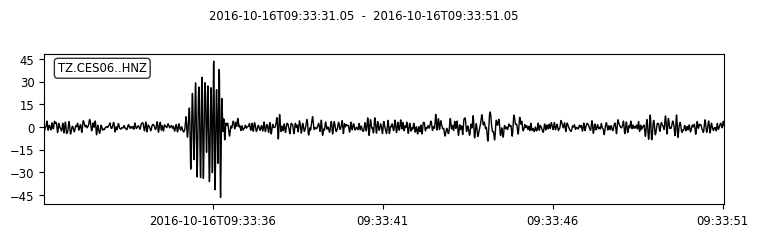

Correlation: 0.458028226040109


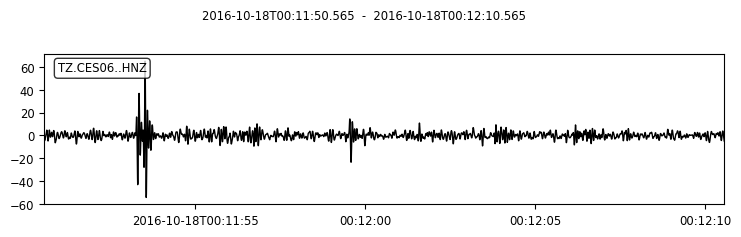

Correlation: -0.4579665516260321


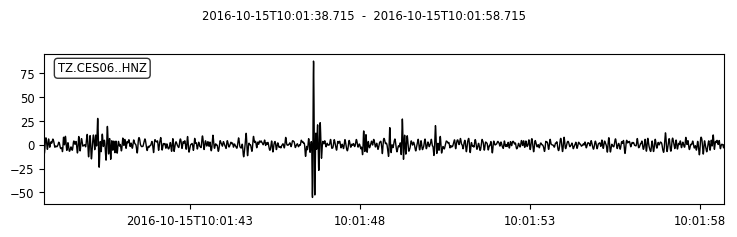

Correlation: -0.45696026236676063


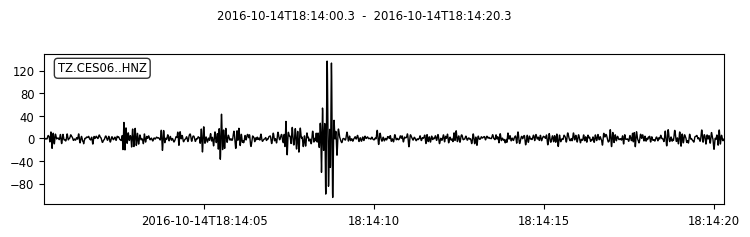

Correlation: -0.45695485255127855


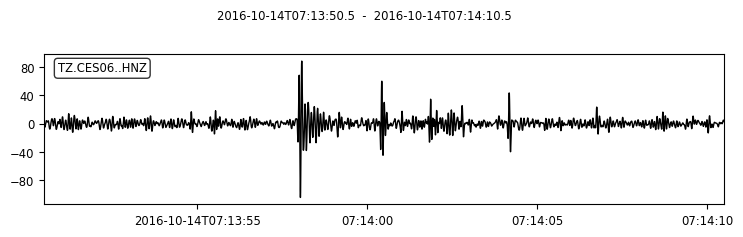

Correlation: -0.45663792925549584


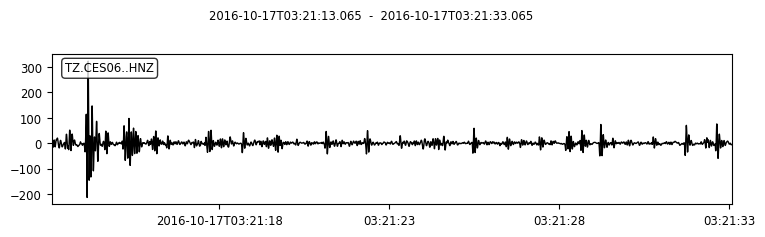

Correlation: 0.45522978150619997


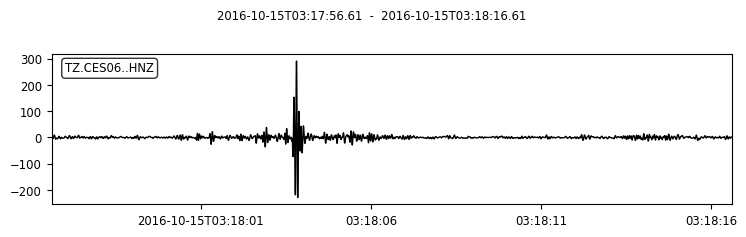

Correlation: -0.4547498210518951


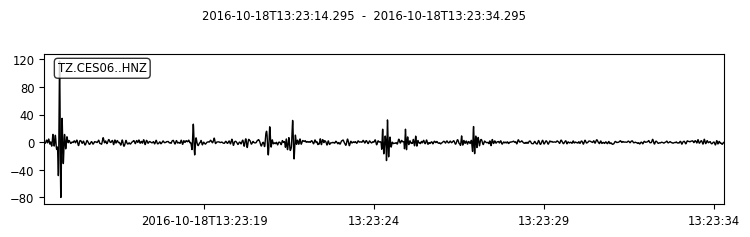

Correlation: -0.45459264182837494


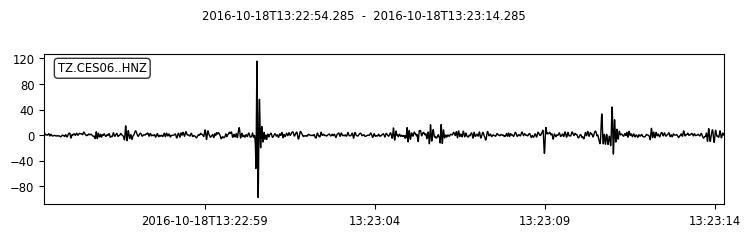

Correlation: 0.4544577584458404


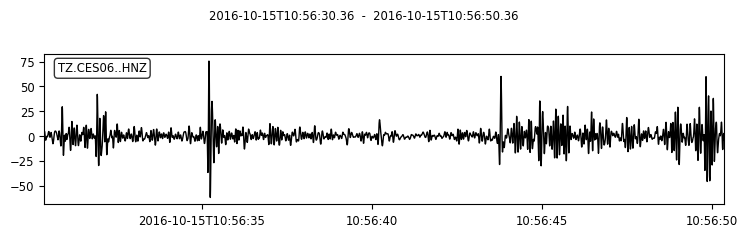

Correlation: -0.4532693539405424


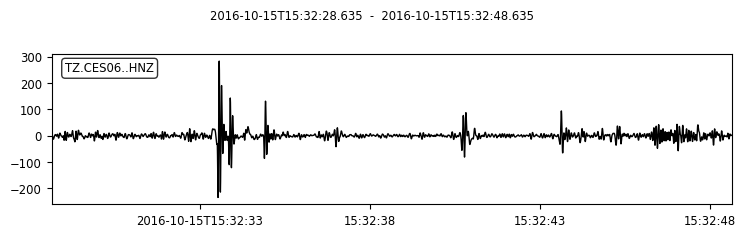

Correlation: 0.4516272779845191


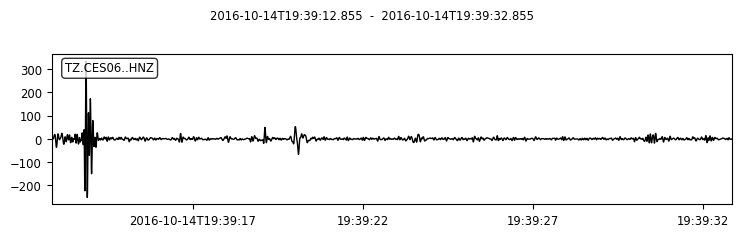

Correlation: -0.4512694221058684


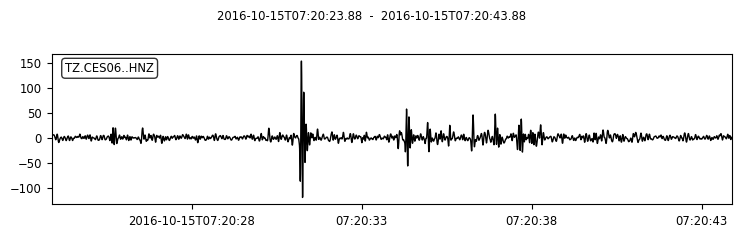

Correlation: 0.45114591885303645


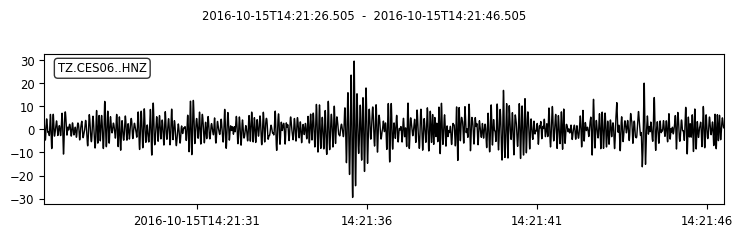

Correlation: -0.4502240282184199


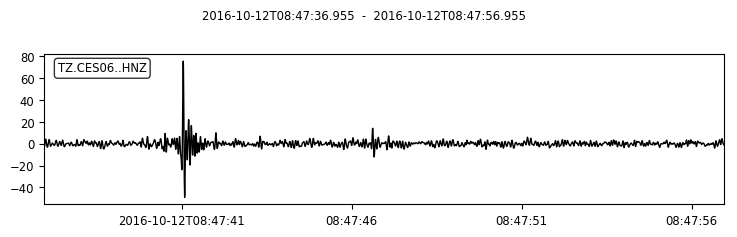

In [49]:
# Get the next range of events

low_threshold = .45
high_threshold = .5

filtered = filter_events(events, low_threshold, high_threshold)
print_events(filtered)